In [1]:
import pandas as pd
import numpy as np
import scipy.stats as sps
import matplotlib.pyplot as plt

## Import data

In [2]:
name = 'Hrshtik'
data = pd.read_csv(name+'.csv')
print(data.info())
print(data.describe)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 458483 entries, 0 to 458482
Data columns (total 5 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   device_id   458483 non-null  int64  
 1   phenomenon  458483 non-null  object 
 2   value       458483 non-null  float64
 3   logged_at   458483 non-null  object 
 4   value_text  0 non-null       float64
dtypes: float64(2), int64(1), object(2)
memory usage: 17.5+ MB
None
<bound method NDFrame.describe of         device_id        phenomenon     value            logged_at  value_text
0           24169       temperature    0.8000  2024-02-10 16:15:00         NaN
1           24169          pressure  989.3600  2024-02-10 16:15:00         NaN
2           24169  formaldehyde_ppb    0.0000  2024-02-10 16:15:00         NaN
3           24169   formaldehyde_ug    0.0000  2024-02-10 16:15:00         NaN
4           24169          tvoc_ppb    0.0000  2024-02-10 16:15:00         NaN
...           ...   

In [3]:
## convert phenomenons as columns

# data.groupby('phenomenon').apply(list).apply(pd.Series).T
data = data.pivot_table(index=['device_id', 'logged_at'], columns='phenomenon', values='value').reset_index()
print(data)

phenomenon  device_id            logged_at    co2_mg  co2_ppm  co_ppb  \
0               24169  2024-02-10 16:15:00  855.6167   447.20    0.00   
1               24169  2024-02-10 16:30:00  849.5286   444.00    0.00   
2               24169  2024-02-10 16:45:00  854.1033   446.40    0.00   
3               24169  2024-02-10 17:00:00  862.1393   450.60    0.00   
4               24169  2024-02-10 17:15:00  849.4402   443.90    0.00   
...               ...                  ...       ...      ...     ...   
15809           24169  2024-09-14 14:30:00  737.1951   424.86  554.12   
15810           24169  2024-09-14 14:45:00  734.1824   423.10  556.98   
15811           24169  2024-09-14 15:00:00  729.8044   420.62  556.22   
15812           24169  2024-09-14 15:15:00  728.1887   419.71  560.37   
15813           24169  2024-09-14 15:30:00  725.1372   418.00  562.02   

phenomenon     co_ug  formaldehyde_ppb  formaldehyde_ug  h2s_ppb   h2s_ug  \
0             0.0000              0.00        

In [33]:
# data = data.drop(['is_old'], axis=1)
data = data.drop(['uv','tvoc_ppb','co_ppb','co_ug','formaldehyde_ppb','formaldehyde_ug','lmax','lmin'], axis=1)
print(data.isnull().values.any())
data[data.isna().any(axis=1)]
data = data.dropna()

KeyError: "['uv', 'tvoc_ppb', 'co_ppb', 'co_ug', 'formaldehyde_ppb', 'formaldehyde_ug', 'lmax', 'lmin'] not found in axis"

In [36]:
print(data.head(10))

   device_id            logged_at    co2_mg  co2_ppm  h2s_ppb   h2s_ug  \
0      24169  2024-02-10 16:15:00  855.6167    447.2    20.84  30.8762   
1      24169  2024-02-10 16:30:00  849.5286    444.0    21.67  32.1072   
2      24169  2024-02-10 16:45:00  854.1033    446.4    21.67  32.1065   
3      24169  2024-02-10 17:00:00  862.1393    450.6    22.39  33.1733   
4      24169  2024-02-10 17:15:00  849.4402    443.9    21.74  32.2148   
5      24169  2024-02-10 17:30:00  852.2312    445.3    21.80  32.3080   
6      24169  2024-02-10 17:45:00  857.3977    447.9    21.37  31.6777   
7      24169  2024-02-10 18:00:00  850.6377    444.4    21.06  31.2160   
8      24169  2024-02-10 18:15:00  849.5149    443.8    21.53  31.9136   
9      24169  2024-02-10 18:30:00  866.7426    452.8    21.53  31.9136   

   humidity   leq   light  no2_ppb  ...  o3_ppb    o3_ug   pm1  pm10  pm100  \
0      90.5  56.6  305.75    21.74  ...    3.12   6.5106  13.7  12.9   13.1   
1      90.7  56.8  282.99  

In [37]:
data.to_csv(name+'_preprocessed.csv', index=False)
data = pd.read_csv(name+'_preprocessed.csv')

## Relation between types of air obstructions
### using Pearson correlation method

In [38]:
air_val = data[data.columns[2:]]

In [39]:
air_val.corr(method='pearson')

,co2_mg,co2_ppm,h2s_ppb,h2s_ug,humidity,leq,light,no2_ppb,no2_ug,no_ppb,...,o3_ppb,o3_ug,pm1,pm10,pm100,pm25,pressure,so2_ppb,so2_ug,temperature
co2_mg,1.000000,0.825551,-0.144576,-0.083598,0.267721,0.135933,-0.099408,0.111806,0.276544,-0.167433,...,-0.299304,-0.244921,0.067598,0.034123,0.014214,0.066711,0.542990,-0.415674,-0.388087,-0.354755
co2_ppm,0.825551,1.000000,-0.177158,-0.163872,0.230109,0.145156,-0.097278,0.254241,0.270998,-0.324518,...,-0.438484,-0.420809,-0.023183,-0.037875,-0.045366,-0.024754,0.013783,-0.520900,-0.514155,-0.213589
h2s_ppb,-0.144576,-0.177158,1.000000,0.994708,0.077051,-0.223351,-0.231650,0.151216,0.150360,0.528947,...,0.099358,0.091169,0.082388,0.088697,0.089056,0.078652,0.000676,0.626403,0.629543,0.050314
h2s_ug,-0.083598,-0.163872,0.994708,1.000000,0.091680,-0.217906,-0.235415,0.139890,0.165512,0.538154,...,0.100920,0.098265,0.096148,0.099154,0.097487,0.092820,0.085806,0.619796,0.627413,0.020734
humidity,0.267721,0.230109,0.077051,0.091680,1.000000,0.071453,-0.308103,-0.025370,0.011987,0.197384,...,-0.093424,-0.083485,0.303252,0.095779,0.014247,0.273226,-0.024927,-0.002400,0.006435,-0.560839
leq,0.135933,0.145156,-0.223351,-0.217906,0.071453,1.000000,0.150287,0.009255,0.015614,-0.030809,...,-0.034246,-0.026903,0.009459,-0.025854,-0.033407,0.006512,-0.025366,-0.240971,-0.239076,-0.213141
light,-0.099408,-0.097278,-0.231650,-0.235415,-0.308103,0.150287,1.000000,-0.064806,-0.073703,-0.071612,...,0.004116,0.003281,-0.078934,-0.021574,-0.000611,-0.061020,0.014296,-0.113044,-0.115775,0.153643
no2_ppb,0.111806,0.254241,0.151216,0.139890,-0.025370,0.009255,-0.064806,1.000000,0.959023,-0.400662,...,-0.528568,-0.535899,-0.089744,-0.060014,-0.029993,-0.111921,-0.017827,-0.107106,-0.111467,0.431154
no2_ug,0.276544,0.270998,0.150360,0.165512,0.011987,0.015614,-0.073703,0.959023,1.000000,-0.358811,...,-0.508199,-0.500340,-0.057640,-0.036427,-0.012103,-0.079848,0.241232,-0.107606,-0.100755,0.352153
no_ppb,-0.167433,-0.324518,0.528947,0.538154,0.197384,-0.030809,-0.071612,-0.400662,-0.358811,1.000000,...,0.430755,0.429194,0.305811,0.250579,0.215496,0.301963,0.007104,0.626975,0.634529,-0.430176


In [52]:
import seaborn as sns
small_sample = air_val.sample(200)

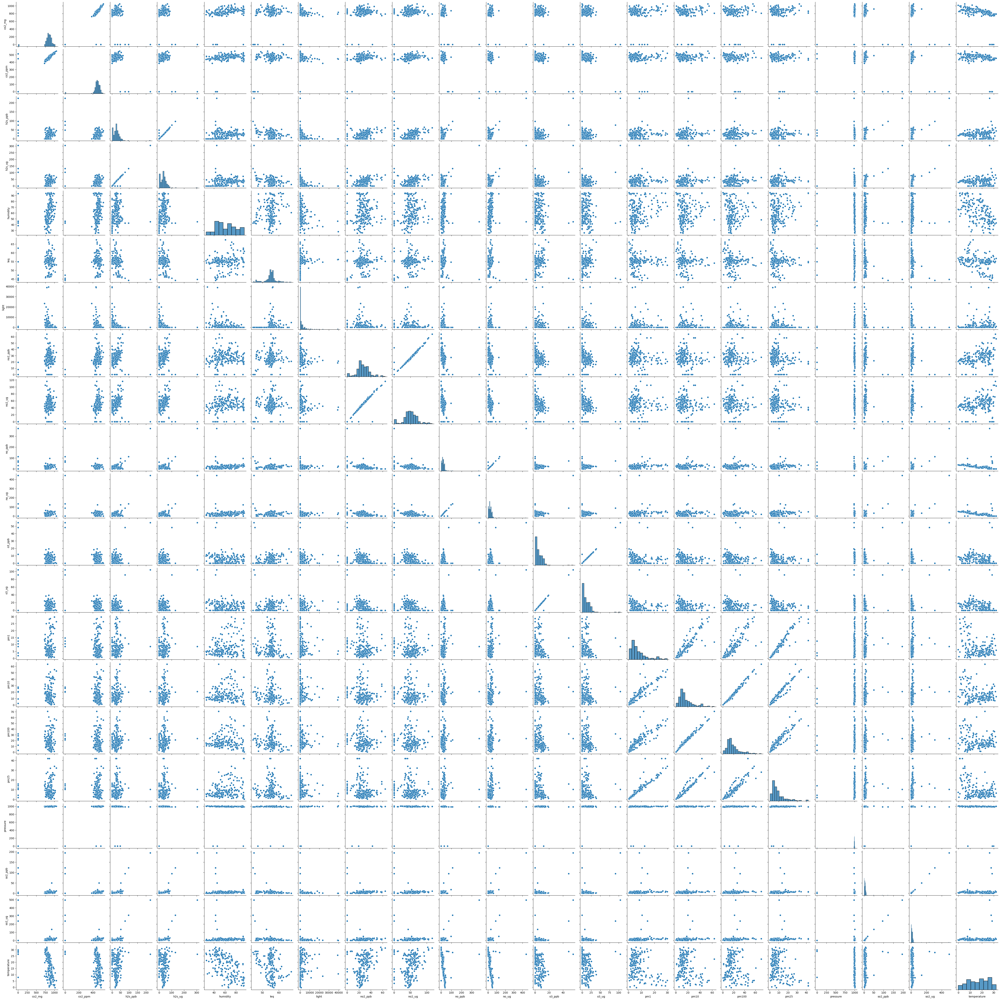

In [53]:
sns.pairplot(small_sample)

In [44]:
selected_cols = ['pm1', 'pm25','pm10','pm100','no_ug', 'so2_ug','no2_ug','h2s_ug']
val = air_val[selected_cols]
val.corr(method='pearson')

,pm1,pm25,pm10,pm100,no_ug,so2_ug,no2_ug,h2s_ug
pm1,1.000000,0.942983,0.877921,0.815833,0.324131,0.137670,-0.057640,0.096148
pm25,0.942983,1.000000,0.946204,0.903150,0.320502,0.133703,-0.079848,0.092820
pm10,0.877921,0.946204,1.000000,0.987158,0.264266,0.141560,-0.036427,0.099154
pm100,0.815833,0.903150,0.987158,1.000000,0.226847,0.139633,-0.012103,0.097487
no_ug,0.324131,0.320502,0.264266,0.226847,1.000000,0.612830,-0.338229,0.527462
so2_ug,0.137670,0.133703,0.141560,0.139633,0.612830,1.000000,-0.100755,0.627413
no2_ug,-0.057640,-0.079848,-0.036427,-0.012103,-0.338229,-0.100755,1.000000,0.165512
h2s_ug,0.096148,0.092820,0.099154,0.097487,0.527462,0.627413,0.165512,1.000000


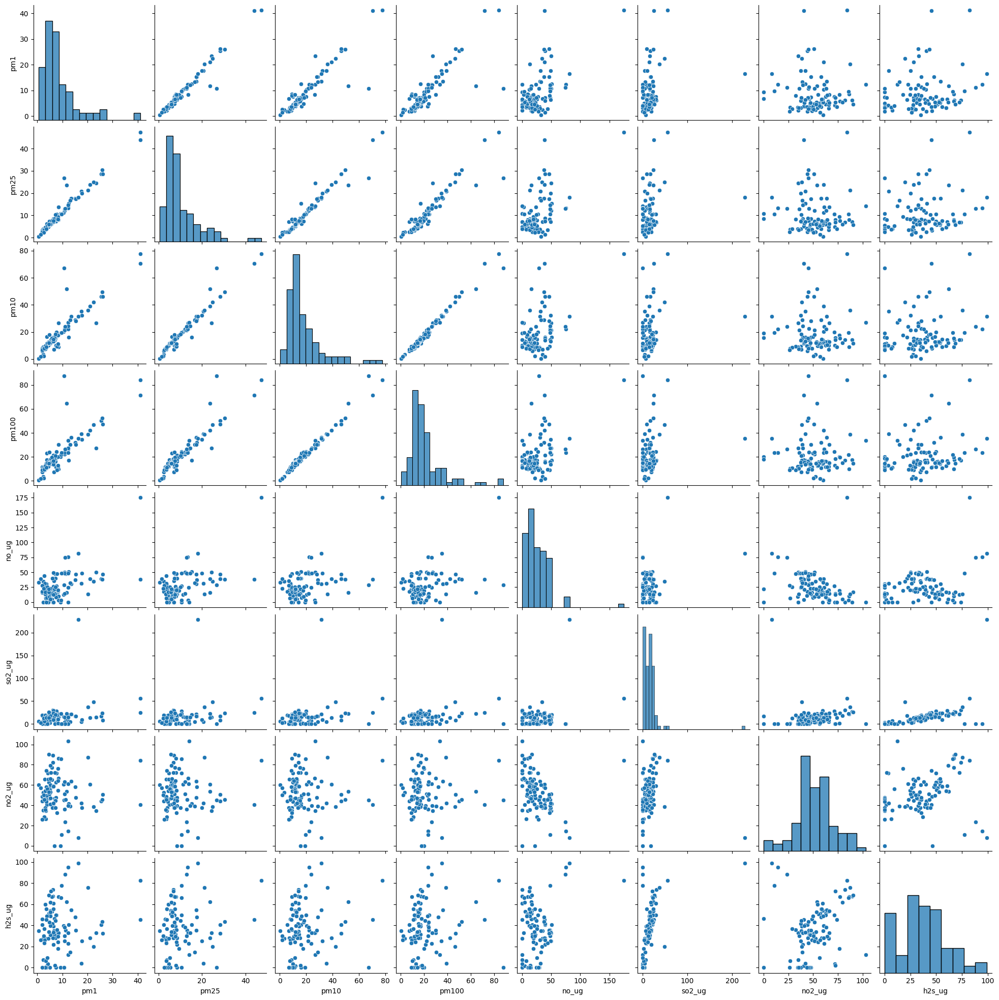

In [49]:
sns.pairplot(val.sample(100))

In [56]:
selected_cols = ['so2_ug', 'co2_mg', 'h2s_ug', 'no2_ug', 'o3_ug', 'no_ug']
val = air_val[selected_cols]
val.corr(method='pearson')

,so2_ug,co2_mg,h2s_ug,no2_ug,o3_ug,no_ug
so2_ug,1.000000,-0.388087,0.627413,-0.100755,0.505260,0.612830
co2_mg,-0.388087,1.000000,-0.083598,0.276544,-0.244921,-0.092076
h2s_ug,0.627413,-0.083598,1.000000,0.165512,0.098265,0.527462
no2_ug,-0.100755,0.276544,0.165512,1.000000,-0.500340,-0.338229
o3_ug,0.505260,-0.244921,0.098265,-0.500340,1.000000,0.426042
no_ug,0.612830,-0.092076,0.527462,-0.338229,0.426042,1.000000


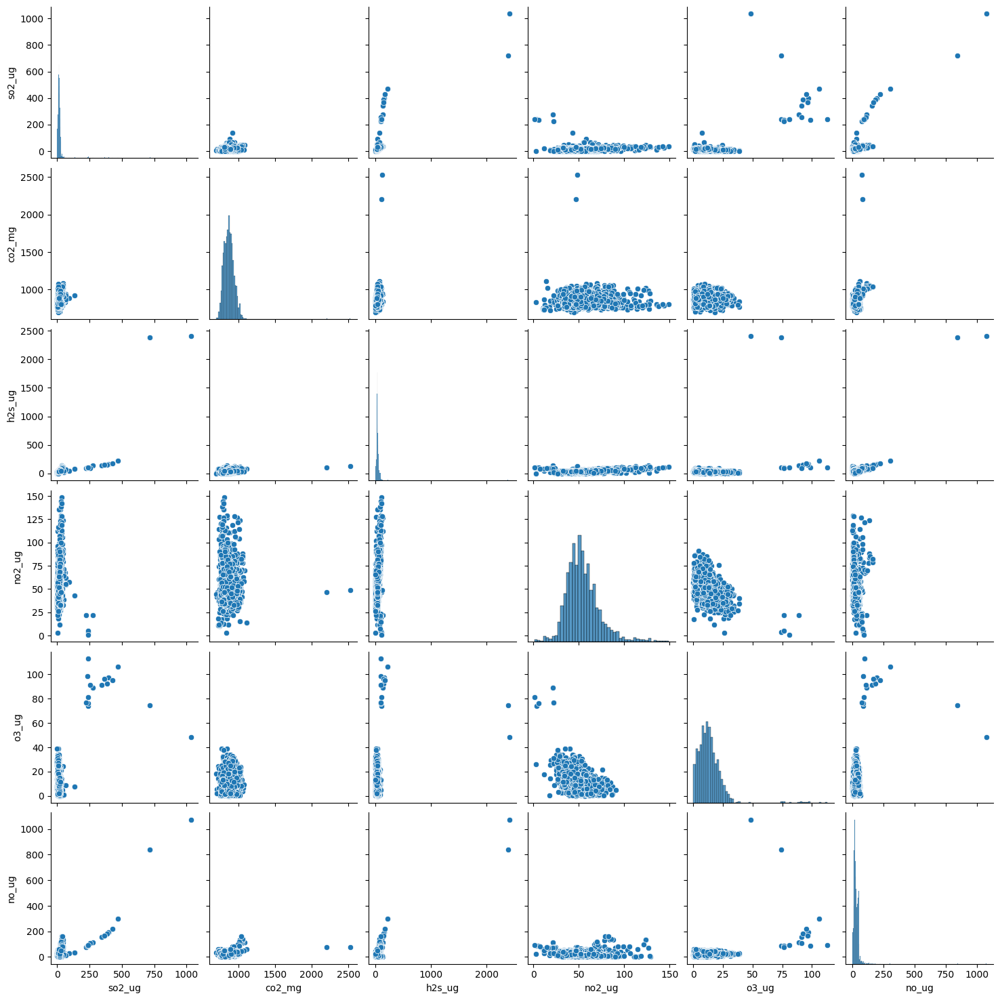

In [89]:
val = val[val!=0]
sns.pairplot(val.sample(2000))

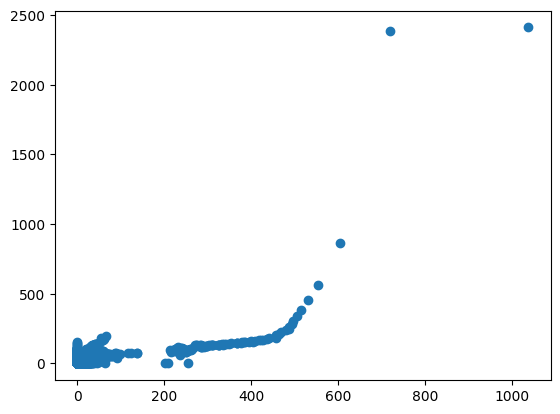

In [69]:
plt.scatter(air_val[['so2_ug']], air_val[['h2s_ug']])

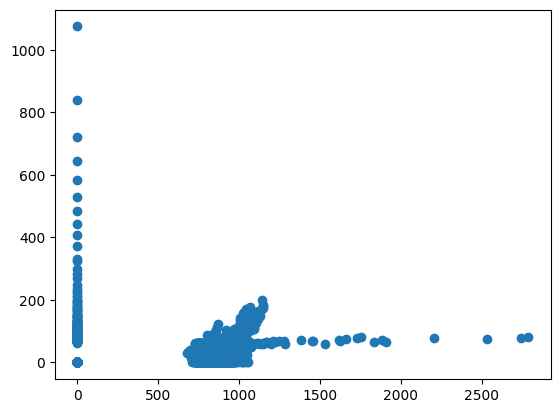

In [82]:
plt.scatter(air_val[['co2_mg']], air_val[['no_ug']])

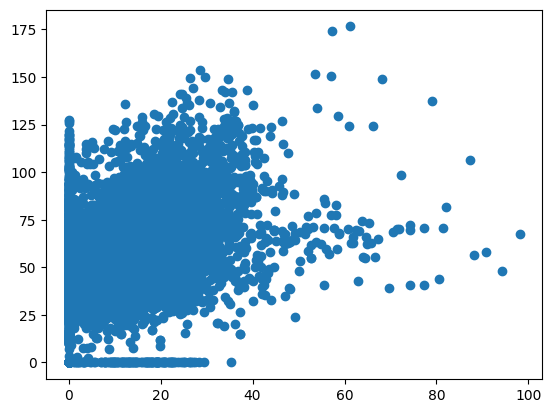

In [81]:
clipped = air_val[air_val['so2_ug']<110]
plt.scatter(clipped[['so2_ug']], clipped[['no2_ug']])

## cleaned zeros

In [86]:
non_zero_data = data[data!=0]
non_zero_data = non_zero_data.dropna()
non_zero_data.to_csv('vals.csv')

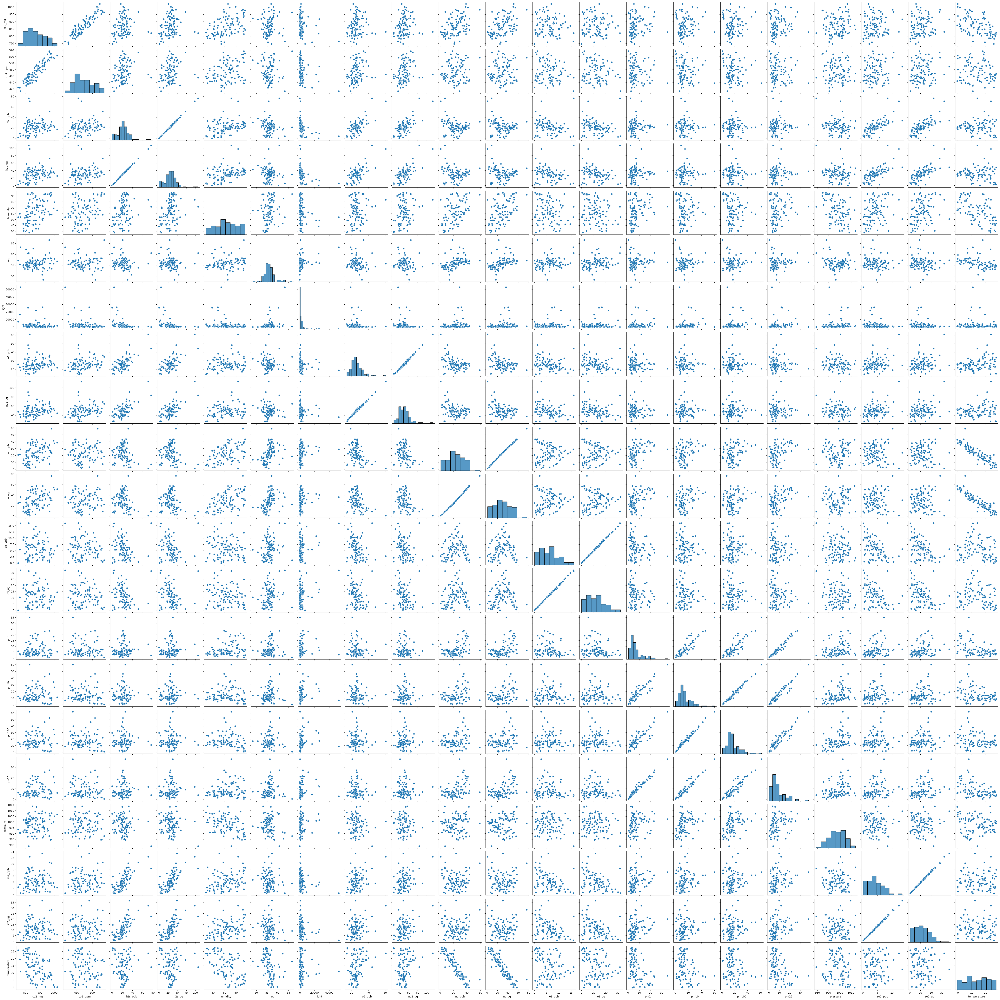

In [90]:
df = non_zero_data[non_zero_data.columns[2:]]
sns.pairplot(df.sample(100))

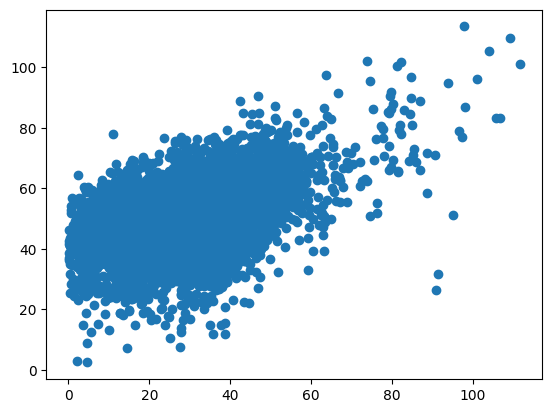

In [93]:
plt.scatter(df[['h2s_ug']], df[['no2_ug']])

In [103]:
import numpy as np

xs = np.array(df['h2s_ug'].to_list())
ys = np.array(df['no2_ug'].to_list())
print(xs)
print(ys)

[30.8762 32.1072 32.1065 ... 25.7455 24.4832 18.9702]
[43.4806 39.5821 46.6016 ... 52.3309 51.1951 48.2853]


In [123]:
#train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(xs, ys, test_size=0.2, random_state=10)

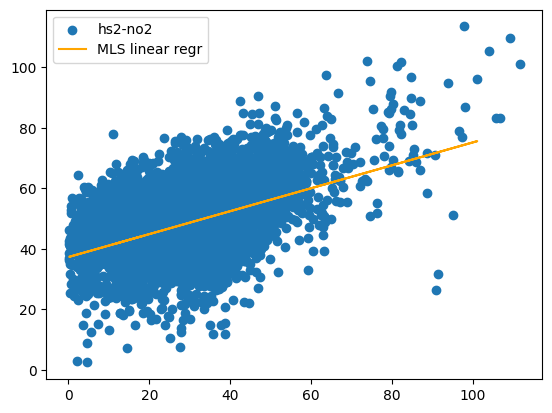

In [125]:
def MLS(x, y, x_h, y_h):  # Method of Least Squares
    enum_sum = 0
    denum_sum = 0
    for i in range(len(x)):
        dx = x[i] - x_h
        enum_sum += dx * (y[i] - y_h)
        denum_sum += dx * dx
    if (denum_sum != 0):
        beta1 = enum_sum / denum_sum
    beta0 = y_h - beta1 * x_h
    return beta1, beta0

x_h = np.mean(X_train)
y_h = np.mean(y_train)
b1, b0 = MLS(xs, ys, x_h, y_h)

def fit(x, b1, b0):
    ys = b1*x + b0
    return ys

fig, ax = plt.subplots()
ax.scatter(xs, ys, label="hs2-no2")
y_p =  fit(X_test, b1, b0)
line, = ax.plot(X_test, y_p, label="MLS linear regr", color='orange')
plt.legend()
plt.show()

In [126]:
def r_squered(y_real, y_predicted):
    y_h = np.mean(y_real)
    diff = y_real - y_h
    tss = np.sum([d**2 for d in diff])
    diff = y_predicted - y_h
    rss = np.sum([d**2 for d in diff])
    R_s = tss/rss
    return R_s

print(R_s)

5.102906346172581


In [127]:
from sklearn.metrics import r2_score
print(r2_score(ys, y_p))

ValueError: Found input variables with inconsistent numbers of samples: [5464, 1093]

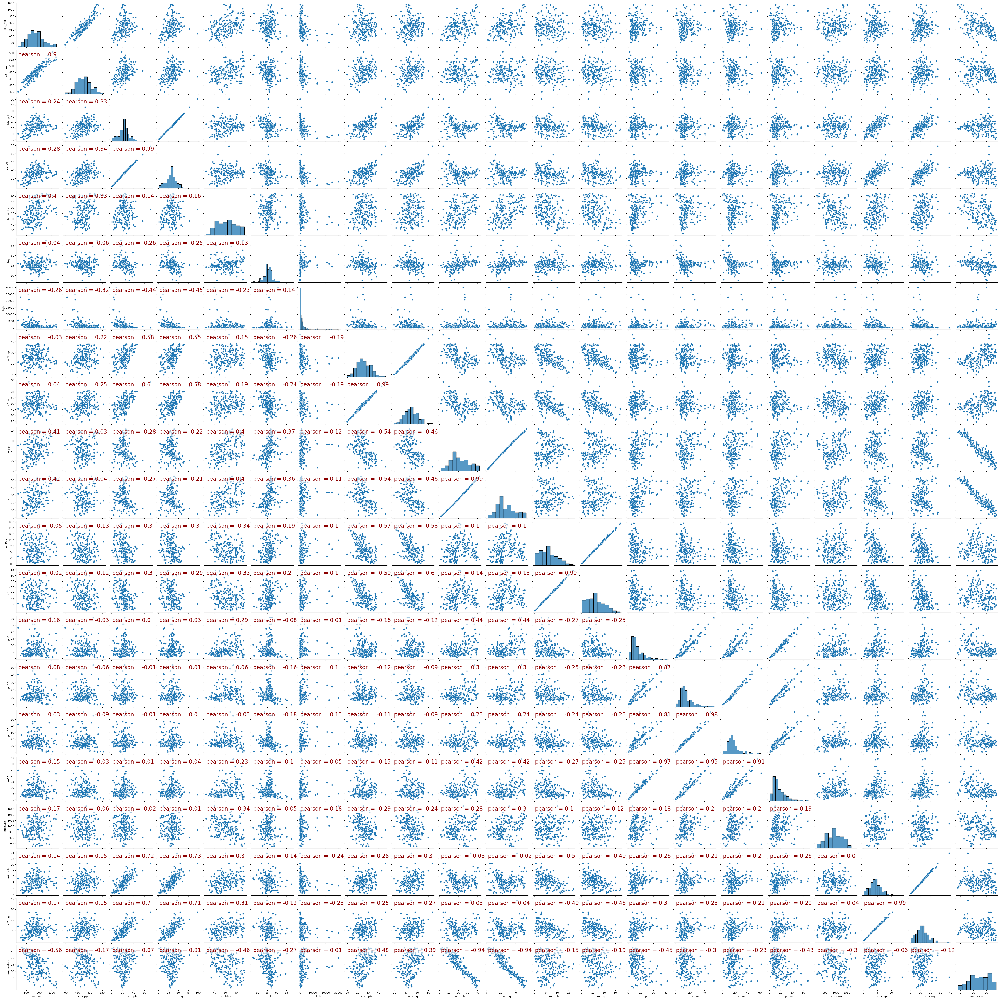

In [141]:
from scipy.stats import pearsonr
import math

def pearson(x, y, ax=None, **kws):
    ax = ax or plt.gca()
    ax.annotate(f'pearson = {math.floor(100*pearsonr(x,y).statistic)/100}',xy=(.05, .95), xycoords=ax.transAxes, fontsize=20,
                color='darkred', backgroundcolor='#FFFFFF99', ha='left', va='top')


df = non_zero_data[non_zero_data.columns[2:]]
g = sns.pairplot(df.sample(200))
g.map_lower(pearson)